Kristjn Eljand, Martin Laid, Jean-Baptiste Scellier, Sohier Dane, Maggie Demkin, Addison Howard. (2023). Enefit - Predict Energy Behavior of Prosumers. Kaggle. [Enefit - Predict Energy Behavior of Prosumers](https://www.kaggle.com/competitions/predict-energy-behavior-of-prosumers/overview)

In [2]:

import os
import json

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.image as mpimg
from matplotlib import colormaps
import seaborn as sea
import geopandas as gpd
import mpl_scatter_density
from seaborn_qqplot import pplot
import matplotlib.pyplot as plt
import plotly
import chart_studio.plotly as py
import plotly.tools as tls
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
import xgboost as xgb


import base64
from io import BytesIO
import warnings

In [3]:
warnings.simplefilter('ignore')
pd.set_option('display.max_columns', 100)
sea.set(style='white', context='notebook', palette='ocean')
colors = colormaps['ocean']

In [4]:
def MatlabFig2HTML(fig):
    buffered = BytesIO()
    fig.savefig(buffered, format="png",  transparent=True)
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    print('<img src=\'data:image/png;base64,{}\'>'.format(img_str))

def PlotlyFig2HTML(fig):
    print(pio.to_html(tls.mpl_to_plotly(fig)))

In [5]:
root = os.path.join(os.getcwd() + '/Data/')

data        = pd.read_csv(os.path.join(root, "train.csv"), low_memory=False)
client      = pd.read_csv(os.path.join(root, "client.csv"), low_memory=False)
gas         = pd.read_csv(os.path.join(root, "gas_prices.csv"), low_memory=False)
electricity = pd.read_csv(os.path.join(root, "electricity_prices.csv"), low_memory=False)
forecast    = pd.read_csv(os.path.join(root, "forecast_weather.csv"), low_memory=False)
historical  = pd.read_csv(os.path.join(root, "historical_weather.csv"), low_memory=False)
location    = pd.read_csv(os.path.join(root, "weather_station_to_county_mapping.csv"), low_memory=False)

# Data type manipiulation
data['hour']        = pd.to_datetime(data['datetime']).dt.hour
data['date']        = pd.to_datetime(data['datetime']).dt.date
client['hour']      = pd.to_datetime(client['date']).dt.hour
client['date']      = pd.to_datetime(client['date']).dt.date
gas['hour']         = pd.to_datetime(gas['forecast_date']).dt.hour
gas['date']         = pd.to_datetime(gas['forecast_date']).dt.date
electricity['hour'] = pd.to_datetime(electricity['forecast_date']).dt.hour
electricity['date'] = pd.to_datetime(electricity['forecast_date']).dt.date
forecast['hour']    = pd.to_datetime(forecast['forecast_datetime']).dt.tz_convert('UTC').dt.hour
forecast['date']    = pd.to_datetime(forecast['forecast_datetime']).dt.tz_convert('UTC').dt.date
historical['hour']  = pd.to_datetime(historical['datetime']).dt.hour
historical['date']  = pd.to_datetime(historical['datetime']).dt.date
forecast['date']    = pd.to_datetime(forecast['forecast_datetime']).dt.tz_convert('UTC').dt.date

# Merge

In [6]:
df0 = data.merge(client.drop('data_block_id', axis=1), on=['county', 'is_business', 'product_type', 'date', 'hour'], how="left")
df1 = df0.merge(gas.loc[:, ['date', 'lowest_price_per_mwh', 'highest_price_per_mwh']], on='date', how='left')
df2 = df1.merge(electricity.loc[:, ['euros_per_mwh', 'date', 'hour']], on=['date', 'hour'], how="left")

forecast_location   = forecast.merge(location, on=['longitude', 'latitude'], how="left")
forecast_location.drop(['forecast_datetime', 'origin_datetime', 'county_name', 'data_block_id'], axis=1, inplace=True)

temp = forecast_location.groupby(['date', 'county']).mean()
df3 = df2.merge(temp,  on=['date', 'county'], how="left", suffixes=('', '_y'))
df3.drop('hour_y', axis=1, inplace=True)


historical_location = historical.merge(location, on=['longitude', 'latitude'], how="left")
historical_location.drop(['datetime', 'longitude', 'latitude', 'county_name', 'data_block_id'], axis=1, inplace=True)

temp = historical_location.groupby(['hour', 'date', 'county']).mean()
df4 = df3.merge(temp,  on=['date', 'hour', 'county'], how="left", suffixes=('', '_hist'))

df4['datetime'] = pd.to_datetime(df4['datetime'])
original_datetime = df4['datetime']
revealed_targets = df4[['datetime', 'prediction_unit_id', 'is_consumption', 'target']].copy()
n_days_lags = 2
for day_lag in range(2, n_days_lags+1):
  revealed_targets['datetime'] = original_datetime + pd.DateOffset(day_lag)
  df4 = df4.merge(revealed_targets, how='left',
                    on = ['datetime', 'prediction_unit_id', 'is_consumption'],
                    suffixes = ('', f'_{day_lag}_days_ago'))

df4 = df4[df4['target'].notnull()]

df = df4.copy()
df['year'] = pd.to_datetime(data['datetime']).dt.year
df['month'] = pd.to_datetime(data['datetime']).dt.month
df['week'] = pd.to_datetime(data['datetime']).dt.isocalendar().week.astype(int)
df['day'] = pd.to_datetime(data['datetime']).dt.day
df['dayofweek'] = pd.to_datetime(data['datetime']).dt.dayofweek
df['monthofquarter'] = df['month']%4

estonian_holidays = [
    (1, 1),   # New Year's Day
    (2, 24),  # Independence Day
    (4, 15),  # Good Friday
    (4, 17),  # Easter Sunday
    (5, 1),   # Spring Day
    (5, 23),  # Whit Sunday
    (6, 23),  # Victory Day
    (6, 24),  # Midsummer Day
    (8, 20),  # Day of Restoration of Independence
    (12, 24), # Christmas Eve
    (12, 25), # Christmas Day
    (12, 26), # Boxing Day
]
def is_estonian_holiday(date):
  if date in estonian_holidays:
      return 1
  else:
      return 0

df['is_holiday'] = df.apply(lambda row: is_estonian_holiday((row['month'], row['day'])), axis=1)

df.drop(['datetime', 'date', 'data_block_id', 'prediction_unit_id', 'row_id'], axis=1, inplace=True)

## Explore dataset

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2017824 entries, 0 to 2018351
Data columns (total 48 columns):
 #   Column                             Dtype  
---  ------                             -----  
 0   county                             int64  
 1   is_business                        int64  
 2   product_type                       int64  
 3   target                             float64
 4   is_consumption                     int64  
 5   hour                               int32  
 6   eic_count                          float64
 7   installed_capacity                 float64
 8   lowest_price_per_mwh               float64
 9   highest_price_per_mwh              float64
 10  euros_per_mwh                      float64
 11  latitude                           float64
 12  longitude                          float64
 13  hours_ahead                        float64
 14  temperature                        float64
 15  dewpoint                           float64
 16  cloudcover_high        

In [8]:
df.isna().sum()

county                                     0
is_business                                0
product_type                               0
target                                     0
is_consumption                             0
hour                                       0
eic_count                            1933986
installed_capacity                   1933986
lowest_price_per_mwh                    3120
highest_price_per_mwh                   3120
euros_per_mwh                           3386
latitude                             1024868
longitude                            1024868
hours_ahead                          1024868
temperature                          1024868
dewpoint                             1024868
cloudcover_high                      1024868
cloudcover_low                       1024868
cloudcover_mid                       1024868
cloudcover_total                     1024868
10_metre_u_wind_component            1024868
10_metre_v_wind_component            1024868
direct_sol

In [9]:
df.shape

(2017824, 48)

The DataFrame is far too bif to be called to be graphed everytime. Let's I'll use a function to randomly acces a portion of the dataset.

In [10]:
target = 'target'
numeric_cols = ['eic_count', 'target_2_days_ago', 'installed_capacity', 'lowest_price_per_mwh', 'highest_price_per_mwh', 'euros_per_mwh', 'latitude', 
                'longitude', 'hours_ahead', 'temperature', 'dewpoint', 'cloudcover_high', 'cloudcover_mid', 'cloudcover_low', 
                'cloudcover_total', '10_metre_u_wind_component', '10_metre_v_wind_component', 'direct_solar_radiation', 'snowfall',
                'surface_solar_radiation_downwards', 'total_precipitation', 'temperature_hist', 'dewpoint_hist', 'rain', 'snowfall_hist',
                'surface_pressure', 'cloudcover_high_hist', 'cloudcover_mid_hist', 'cloudcover_low_hist', 'cloudcover_total_hist',
                'windspeed_10m', 'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation_hist', 'diffuse_radiation']
categoric_cols = ['county', 'is_business', 'product_type', 'is_holiday', 'is_consumption']
time_cols = ['year', 'month', 'week', 'day', 'hour', 'monthofquarter', 'dayofweek']

In [11]:
sorted(list(df.columns)) == sorted(numeric_cols + categoric_cols + [target] + time_cols)

True

In [12]:
y = df['target']
X = df.drop(['target'], axis=1)

In [13]:
ct = ColumnTransformer(transformers=
                       [('numeric', StandardScaler(), numeric_cols),
                        ('categoric', OneHotEncoder(handle_unknown='ignore', drop='if_binary'), categoric_cols)],
                       remainder='passthrough', verbose_feature_names_out=False)

temp = ct.fit_transform(X)
X_fit = pd.DataFrame(temp, columns=list(ct.get_feature_names_out()))

In [14]:
X_fit.sample(10)

,eic_count,target_2_days_ago,installed_capacity,lowest_price_per_mwh,highest_price_per_mwh,euros_per_mwh,latitude,longitude,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_mid,cloudcover_low,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,direct_solar_radiation,snowfall,surface_solar_radiation_downwards,total_precipitation,temperature_hist,dewpoint_hist,rain,snowfall_hist,surface_pressure,cloudcover_high_hist,cloudcover_mid_hist,cloudcover_low_hist,cloudcover_total_hist,windspeed_10m,winddirection_10m,shortwave_radiation,direct_solar_radiation_hist,diffuse_radiation,county_0,county_1,county_2,county_3,county_4,county_5,county_6,county_7,county_8,county_9,county_10,county_11,county_12,county_13,county_14,county_15,is_business_1,product_type_0,product_type_1,product_type_2,product_type_3,is_holiday_1,is_consumption_1,hour,year,month,week,day,dayofweek,monthofquarter
714020,NaN,-0.291161,NaN,-0.013715,-0.023816,-0.726477,0.599869,0.513913,0.003417,0.353343,0.031867,0.070136,-1.284710,-1.291610,-0.979713,-2.083400,-1.198952,1.658851,-0.392719,1.361937,-0.588625,0.792695,-0.132335,-0.250370,-0.225368,0.301788,0.173845,-0.924317,-1.203984,-1.336975,0.693102,-2.008963,3.293480,4.038214,0.985909,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,13.0,2022.0,4.0,16.0,20.0,2.0,0.0
1602537,NaN,-0.265944,NaN,-0.724317,-0.696757,-0.120485,0.599869,0.997960,0.003417,-1.017071,-0.941856,0.399166,-0.835012,0.289147,-0.002049,-1.057830,-1.199953,-0.547348,-0.373784,-0.880597,-0.579150,-0.939938,-0.813130,-0.250370,-0.225368,1.738511,1.225924,0.021222,0.395275,0.998161,-0.941831,-2.100748,-0.591104,-0.476689,-0.679014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,8.0,2023.0,1.0,3.0,21.0,5.0,1.0
761171,NaN,-0.272439,NaN,0.200454,0.124468,-1.020201,-1.209368,0.352564,0.003417,0.421867,-0.587601,0.506904,2.032002,-0.864036,1.025588,0.047140,0.795697,0.000711,-0.392623,0.987703,-0.558749,-0.384076,-0.664838,-0.250370,-0.225368,0.809561,1.519528,-0.110103,-1.203984,-0.397553,-1.182471,-0.310954,-0.591104,-0.476689,-0.679014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,2022.0,5.0,18.0,5.0,3.0,1.0
1606747,NaN,1.784711,NaN,-0.682282,-0.718854,0.111841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,16.0,2023.0,1.0,3.0,22.0,6.0,1.0
987216,NaN,-0.175621,NaN,1.398452,1.217974,1.457665,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,13.0,2022.0,7.0,28.0,14.0,3.0,3.0
1126739,NaN,-0.241140,NaN,3.037818,2.770213,0.268181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,14.0,2022.0,8.0,34.0,27.0,5.0,0.0
470698,NaN,-0.296312,NaN,-0.367019,-0.443834,0.290268,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,13.0,2022.0,2.0,5.0,3.0,3.0,2.0
1732244,NaN,-0.302129,NaN,-0.934492,-1.007022,-0.445444,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,21.0,2023.0,3.0,9.0,2.0,3.0,3.0
1349344,NaN,-0.302129,NaN,0.032313,0.122277,0.475452,0.599869,0.029867,0.003417,0.036226,0.376076,-1.322071,-0.822982,0.962049,0.340789,-1.152079,0.120496,-0.792599,-0.392719,-0.902103,-0.532717,0.077171,0.521497,0.284786,-0.225368,-0.001302,-0.

## Target Distribution

In [15]:
i = 15

In [16]:
numeric_cols

['eic_count',
 'target_2_days_ago',
 'installed_capacity',
 'lowest_price_per_mwh',
 'highest_price_per_mwh',
 'euros_per_mwh',
 'latitude',
 'longitude',
 'hours_ahead',
 'temperature',
 'dewpoint',
 'cloudcover_high',
 'cloudcover_mid',
 'cloudcover_low',
 'cloudcover_total',
 '10_metre_u_wind_component',
 '10_metre_v_wind_component',
 'direct_solar_radiation',
 'snowfall',
 'surface_solar_radiation_downwards',
 'total_precipitation',
 'temperature_hist',
 'dewpoint_hist',
 'rain',
 'snowfall_hist',
 'surface_pressure',
 'cloudcover_high_hist',
 'cloudcover_mid_hist',
 'cloudcover_low_hist',
 'cloudcover_total_hist',
 'windspeed_10m',
 'winddirection_10m',
 'shortwave_radiation',
 'direct_solar_radiation_hist',
 'diffuse_radiation']

In [17]:
temp = ['temperature', 'dewpoint', 'cloudcover_high', 'cloudcover_low', 'cloudcover_mid', 'cloudcover_total', '10_meter_u_wind_component', 
        '10_meter_u_wind_component', 'direct_solar_radiation', 'snowfall', 'surface_solar_radiation_downwards', 'total_precipitation', 
        'surface_pressure', 'shortwave_radiation', 'diffuse_radiation']
aux = iter(temp)

<Axes: xlabel='temperature', ylabel='target'>

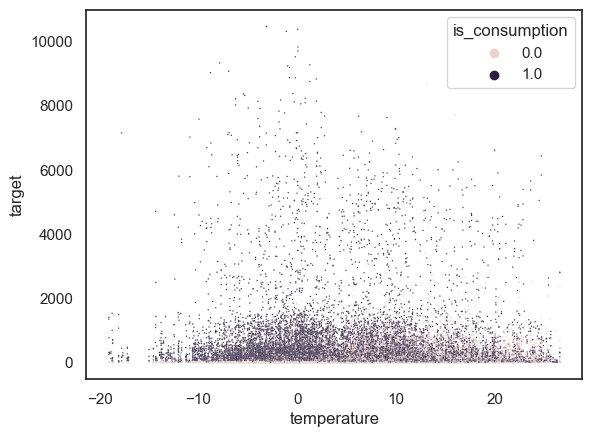

In [18]:
val = next(aux)
sea.scatterplot(data=df.sample(100000), x=val, y=df['target'], hue="is_consumption", s=1)

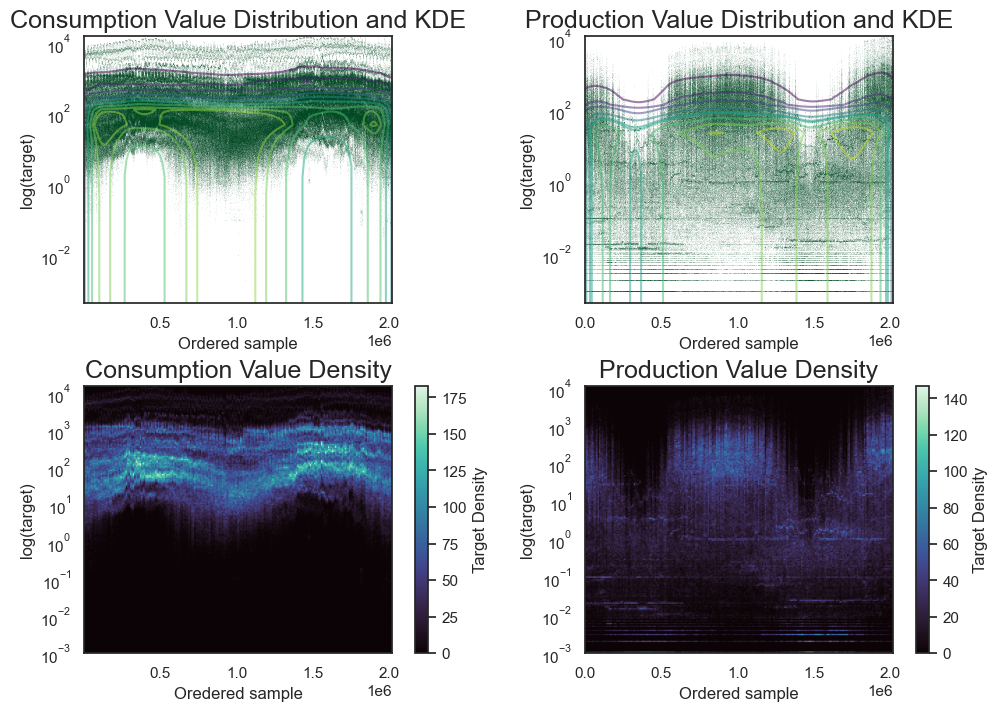

In [101]:
fig = plt.figure(constrained_layout=True, figsize=(10,7))
spec = gridspec.GridSpec(ncols=2, nrows=2, figure=fig)
ax0 = fig.add_subplot(spec[0, 0])
ax1 = fig.add_subplot(spec[0, 1])
ax2 = fig.add_subplot(spec[1, 0], projection='scatter_density', sharex=ax0)
ax3 = fig.add_subplot(spec[1, 1], projection='scatter_density', sharex=ax1)

temp = df[(df.is_consumption==1) & (df.target>0)]

sea.scatterplot(data = temp, x=temp.index, y='target', marker='x', s=0.1, ax=ax0);
sea.kdeplot(data = temp, x=temp.index, y='target', cmap='viridis', alpha=0.5, ax=ax0, label='KDE');
ax0.set_xlabel('Ordered sample')
ax0.set_ylabel('log(target)')
ax0.set_yscale('log')
ax0.set_title('Consumption Value Distribution and KDE', size=18)

density = ax2.scatter_density(data=temp, x=temp.index, y=temp.target, cmap='mako');
fig.colorbar(density, label='Target Density')
ax2.set_xlabel('Oredered sample')
ax2.set_ylabel('log(target)')
ax2.set_yscale('log')
ax2.set_title('Consumption Value Density', size=18)

temp = df[(df.is_consumption==0) & (df.target>0)]

sea.scatterplot(data = temp, x=temp.index, y='target', marker='x', s=0.1, ax=ax1);
sea.kdeplot(data = temp, x=temp.index, y='target', cmap='viridis', alpha=0.5, ax=ax1);
ax1.set_xlabel('Ordered sample')
ax1.set_ylabel('log(target)')
ax1.set_yscale('log')
ax1.set_title('Production Value Distribution and KDE', size=18)

density = ax3.scatter_density(data=temp, x=temp.index, y=temp.target, cmap='mako');
fig.colorbar(density, label='Target Density')
ax3.set_xlabel('Ordered sample')
ax3.set_ylabel('log(target)')
ax3.set_yscale('log')
ax3.set_title('Production Value Density', size=18)


plt.show()

## Time relationships

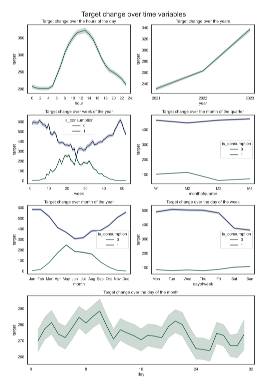

In [20]:

try:
    img = mpimg.imread(os.path.join(os.getcwd(), "Target change over time variables.jpg"))
    plt.imshow(img)
    plt.axis('off')
    plt.show()
except FileNotFoundError:
    
    fig = plt.figure(constrained_layout=True, figsize=(10,15))
    spec = gridspec.GridSpec(ncols=2, nrows=4, figure=fig)
    ax0 = fig.add_subplot(spec[3, :])
    ax1 = fig.add_subplot(spec[1, 0])
    ax2 = fig.add_subplot(spec[1, 1])
    ax3 = fig.add_subplot(spec[2, 0])
    ax4 = fig.add_subplot(spec[2, 1])
    ax5 = fig.add_subplot(spec[0, 0])
    ax6 = fig.add_subplot(spec[0, 1])

    # Show target change over week of the year
    sea.lineplot(data=df, x='week', y='target', ax=ax1, hue='is_consumption');
    ax1.set_title('Target change over week of the year')

    # Show target change over the month of the quarter
    sea.lineplot(data=df, x='monthofquarter', y='target', ax=ax2, hue='is_consumption').set_xticks(range(4), labels=['M1', 'M2', 'M3', 'M4']);
    ax2.set_title('Target change over the month of the quarter')

    # Show target change over month of the year
    months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    sea.lineplot(data=df, x='month', y='target', ax=ax3, hue='is_consumption').set_xticks(range(1, len(months)+1), months);
    ax3.set_title('Target change over month of the year')

    # Show target change over the day of the week
    daysofweek = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    sea.lineplot(data=df, x='dayofweek', y='target', ax=ax4, hue='is_consumption').set_xticks(range(len(daysofweek)), daysofweek);
    ax4.set_title('Target change over the day of the week');

    # Show target change over the hours of the day
    sea.lineplot(data=df, x='hour', y='target', ax=ax5).set_xticks([i*2 for i in range(13)]);
    ax5.set_title('Target change over the hours of the day')

    # Show target change over the years
    sea.lineplot(data=df, x='year', y='target', ax=ax6).set_xticks([i for i in range(2021, 2024)]);
    ax6.set_title('Target change over the years')

    # Show target change over the day of the month
    sea.lineplot(data=df, x='day', y='target', ax=ax0).set_xticks([i*8 for i in range(5)]);
    ax0.set_title('Target change over the day of the month')

    fig.suptitle('Target change over time variables', size=20)
    fig.tight_layout()
    Fig2HTML(fig)
    fig.savefig('Target change over time variables.jpg', bbox_inches='tight', dpi=600)

In [21]:
PlotlyFig2HTML(fig)

<html>
<head><meta charset="utf-8" /></head>
<body>
    <div>                        <script type="text/javascript">window.PlotlyConfig = {MathJaxConfig: 'local'};</script>
        <script type="text/javascript">/**
* plotly.js v2.27.0
* Copyright 2012-2023, Plotly, Inc.
* All rights reserved.
* Licensed under the MIT license
*/
/*! For license information please see plotly.min.js.LICENSE.txt */
!function(t,e){"object"==typeof exports&&"object"==typeof module?module.exports=e():"function"==typeof define&&define.amd?define([],e):"object"==typeof exports?exports.Plotly=e():t.Plotly=e()}(self,(function(){return function(){var t={98847:function(t,e,r){"use strict";var n=r(71828),i={"X,X div":'direction:ltr;font-family:"Open Sans",verdana,arial,sans-serif;margin:0;padding:0;',"X input,X button":'font-family:"Open Sans",verdana,arial,sans-serif;',"X input:focus,X button:focus":"outline:none;","X a":"text-decoration:none;","X a:hover":"text-decoration:none;","X .crisp":"shape-rendering:crispE

## County relationships

In [22]:
county_names = open('Data/county_id_to_name_map.json')
county_codes = {v.lower().rstrip("maa"): k for k, v in json.load(county_names).items()}
county_codes = {int(value): key.capitalize() for key, value in county_codes.items()}
missing_a = [3, 4, 8, 9, 13]
for idx in missing_a:
    county_codes[idx] = county_codes[idx] + 'a'
county_codes[2] = 'Ida-Viru'
county_codes[5] = 'Lääne-Viru'
county_codes[12] = 'Peipsi'
county_names = {value:key for key,value in county_codes.items()}
county_names

{'Harju': 0,
 'Hiiu': 1,
 'Ida-Viru': 2,
 'Järva': 3,
 'Jõgeva': 4,
 'Lääne-Viru': 5,
 'Lääne': 6,
 'Pärnu': 7,
 'Põlva': 8,
 'Rapla': 9,
 'Saare': 10,
 'Tartu': 11,
 'Peipsi': 12,
 'Valga': 13,
 'Viljandi': 14,
 'Võru': 15}

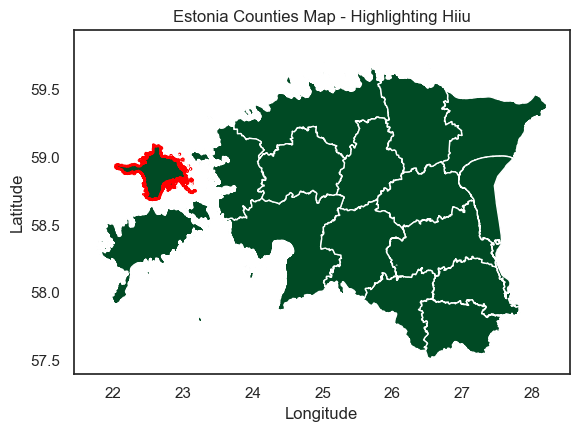

In [23]:
file_path = "EstoniaGeodata/EST_adm1.shp"
# https://geodata.lib.utexas.edu/catalog/stanford-cv588yj7627
estonia_map = gpd.read_file(file_path)
estonia_map['county'] = estonia_map['NAME_1'].apply(lambda x: county_names[x])
county_code = 1
county_polygon = estonia_map[estonia_map['NAME_1'] == county_codes[county_code]]

fig, ax = plt.subplots()
estonia_map.plot(ax=ax)
county_polygon.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2)
plt.title(f"Estonia Counties Map - Highlighting {county_codes[county_code]}")

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

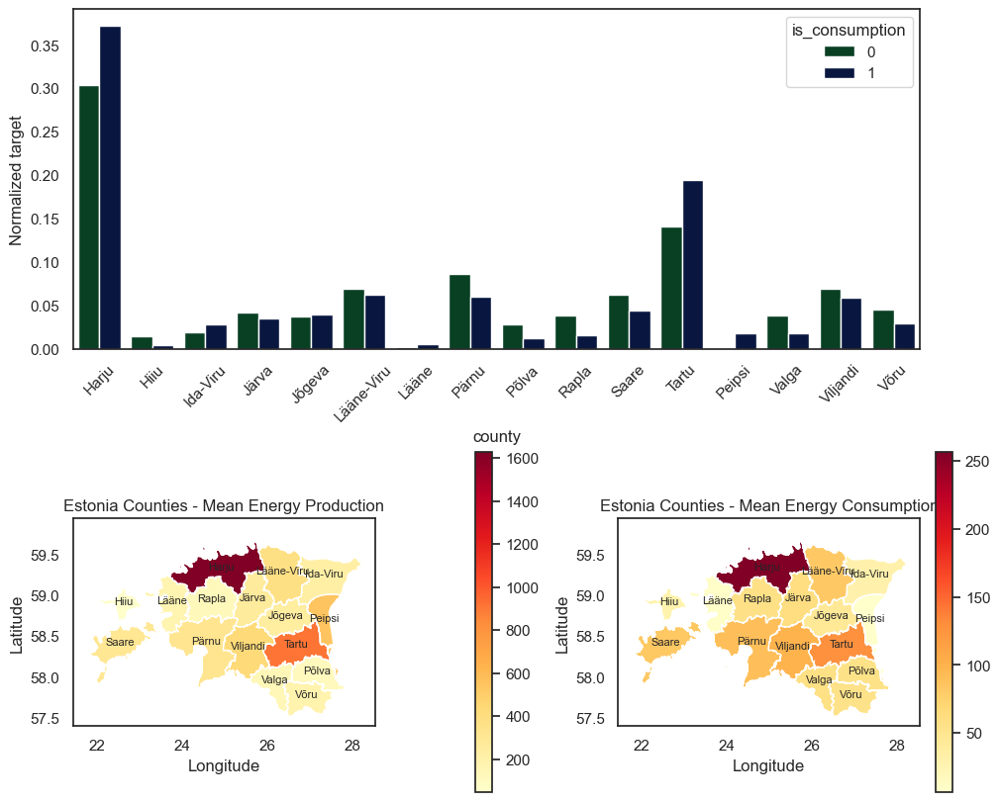

In [25]:
fig = plt.figure(constrained_layout=True, figsize=(10,8))
spec = gridspec.GridSpec(ncols=2, nrows=2, figure=fig)
ax0 = fig.add_subplot(spec[0, :])
ax1 = fig.add_subplot(spec[1, 0])
ax2 = fig.add_subplot(spec[1, 1])

temp = df[['county', 'target', 'is_consumption']]
norm_factors = temp.groupby('is_consumption')['target'].transform('sum')
temp['Normalized target'] = temp['target'] / norm_factors
barplot = sea.barplot(x='county', y='Normalized target', data=temp, estimator=np.sum, errorbar=None, hue='is_consumption', ax=ax0);
ax0.set_xticklabels([county_codes[i] for i in barplot.get_xticks()], rotation=45)

temp = df[df['is_consumption'] == 1]
grouped = temp.groupby('county').mean().reset_index()
estonia_map = estonia_map.merge(grouped[['county', 'target']], on='county', how='inner')
estonia_map.rename(columns={'target': 'Consumer target mean'}, inplace=True)

temp = df[df['is_consumption'] == 0]
grouped = temp.groupby('county').mean().reset_index()
estonia_map = estonia_map.merge(grouped[['county', 'target']], on='county', how='inner')
estonia_map.rename(columns={'target': 'Producer target mean'}, inplace=True)

estonia_map.plot(column='Consumer target mean', cmap='YlOrRd', ax=ax1, legend=True)
estonia_map.plot(column='Producer target mean', cmap='YlOrRd', ax=ax2, legend=True)

for idx, row in estonia_map.iterrows():
    ax1.annotate(text=county_codes[county_names[row['NAME_1']]], xy=row['geometry'].centroid.coords[0], horizontalalignment='center', size=8)
    ax2.annotate(text=county_codes[county_names[row['NAME_1']]], xy=row['geometry'].centroid.coords[0], horizontalalignment='center', size=8)

ax1.set_title("Estonia Counties - Mean Energy Production")
ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")

ax2.set_title("Estonia Counties - Mean Energy Consumption")
ax2.set_xlabel("Longitude")
ax2.set_ylabel("Latitude")

plt.show()



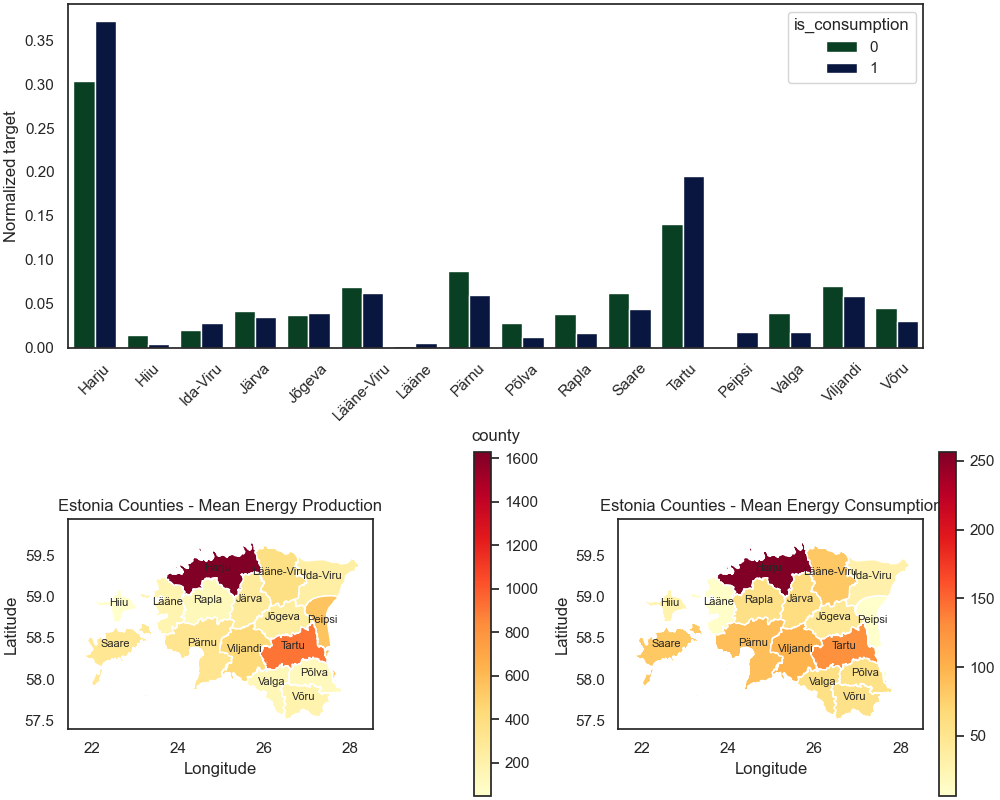

In [26]:
MatlabFig2HTML(fig)

In [27]:
categoric_cols

['county', 'is_business', 'product_type', 'is_holiday', 'is_consumption']

In [28]:
aux = iter(categoric_cols)

In [33]:
temp = df.groupby('county').count().iloc[:, 0].reset_index()
temp.columns = ['Category', 'Count']
temp['Name'] = temp['Category'].apply(lambda x: county_codes[x])
fig = px.pie(temp, values='Count', names='Name', title='Pie Chart of {} Values'.format(i), width=500, height=500)
fig.show()

In [34]:
html_content = pio.to_html(fig)
print(html_content)

<html>
<head><meta charset="utf-8" /></head>
<body>
    <div>                        <script type="text/javascript">window.PlotlyConfig = {MathJaxConfig: 'local'};</script>
        <script type="text/javascript">/**
* plotly.js v2.27.0
* Copyright 2012-2023, Plotly, Inc.
* All rights reserved.
* Licensed under the MIT license
*/
/*! For license information please see plotly.min.js.LICENSE.txt */
!function(t,e){"object"==typeof exports&&"object"==typeof module?module.exports=e():"function"==typeof define&&define.amd?define([],e):"object"==typeof exports?exports.Plotly=e():t.Plotly=e()}(self,(function(){return function(){var t={98847:function(t,e,r){"use strict";var n=r(71828),i={"X,X div":'direction:ltr;font-family:"Open Sans",verdana,arial,sans-serif;margin:0;padding:0;',"X input,X button":'font-family:"Open Sans",verdana,arial,sans-serif;',"X input:focus,X button:focus":"outline:none;","X a":"text-decoration:none;","X a:hover":"text-decoration:none;","X .crisp":"shape-rendering:crispE

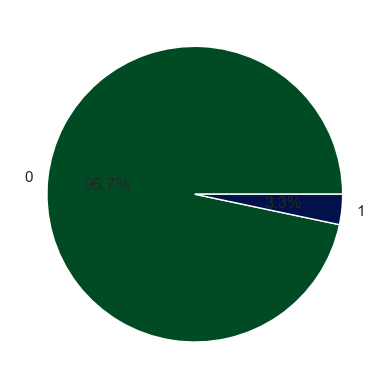

In [35]:
fig = plt.figure()
ax = fig.add_subplot()
ax.pie(df.groupby('is_holiday').count().iloc[:, 0], 
       labels=df.groupby('is_consumption').count().index, 
       autopct='%1.1f%%');

In [89]:
temp1 = df[(df['is_consumption']==0) & (df['target']>0)].groupby('is_holiday').mean().target.reset_index()
temp1.is_holiday = ['Not a holiday', 'Holiday']
temp1['is_consumption'] = ['Production', 'Production']
temp2 = df[(df['is_consumption']==1) & (df['target']>0)].groupby('is_holiday').mean().target.reset_index()
temp2.is_holiday = ['Not a holiday', 'Holiday']
temp2['is_consumption'] = ['Consumption', 'Consumption']

aux = pd.concat([temp1, temp2], axis=0)

fig = px.bar(aux, x='is_consumption', y='target', color='is_holiday', 
             barmode='stack', title='Stacked Bar Plot of mean Holiday Target Values',
             labels={'index': 'Categories', 'Values': 'Values'})

i = 0
for index, row in aux.iterrows():
    y = row['target']/2 if i%2==0 else 3/2*row['target']
    fig.add_annotation(x=row['is_consumption'], y=y, 
                       text=str(row['target']),
                       showarrow=False,
                       font=dict(color='black', size=10))
    i += 1
    
    
fig.show()


In [90]:
html_content = pio.to_html(fig)
print(html_content)

<html>
<head><meta charset="utf-8" /></head>
<body>
    <div>                        <script type="text/javascript">window.PlotlyConfig = {MathJaxConfig: 'local'};</script>
        <script type="text/javascript">/**
* plotly.js v2.27.0
* Copyright 2012-2023, Plotly, Inc.
* All rights reserved.
* Licensed under the MIT license
*/
/*! For license information please see plotly.min.js.LICENSE.txt */
!function(t,e){"object"==typeof exports&&"object"==typeof module?module.exports=e():"function"==typeof define&&define.amd?define([],e):"object"==typeof exports?exports.Plotly=e():t.Plotly=e()}(self,(function(){return function(){var t={98847:function(t,e,r){"use strict";var n=r(71828),i={"X,X div":'direction:ltr;font-family:"Open Sans",verdana,arial,sans-serif;margin:0;padding:0;',"X input,X button":'font-family:"Open Sans",verdana,arial,sans-serif;',"X input:focus,X button:focus":"outline:none;","X a":"text-decoration:none;","X a:hover":"text-decoration:none;","X .crisp":"shape-rendering:crispE

In [ ]:
temp1 = df[df['is_consumption']==0].groupby('is_holiday')
temp2 = df[df['is_consumption']==1].groupby('is_holiday')

fig = px.pie(temp1.mean(), values='target', names=['Not a holiday', 'Holiday'], title='Pie Chart of Producers Target Values', width=500, height=500)
fig.show()
html_content = pio.to_html(fig)
print(html_content)

fig = px.pie(temp2.mean(), values='target', names=['Not a holiday', 'Holiday'], title='Pie Chart of Consumers Target Values', width=500, height=500)
fig.show()
html_content = pio.to_html(fig)
print(html_content)

<html>
<head><meta charset="utf-8" /></head>
<body>
    <div>                        <script type="text/javascript">window.PlotlyConfig = {MathJaxConfig: 'local'};</script>
        <script type="text/javascript">/**
* plotly.js v2.27.0
* Copyright 2012-2023, Plotly, Inc.
* All rights reserved.
* Licensed under the MIT license
*/
/*! For license information please see plotly.min.js.LICENSE.txt */
!function(t,e){"object"==typeof exports&&"object"==typeof module?module.exports=e():"function"==typeof define&&define.amd?define([],e):"object"==typeof exports?exports.Plotly=e():t.Plotly=e()}(self,(function(){return function(){var t={98847:function(t,e,r){"use strict";var n=r(71828),i={"X,X div":'direction:ltr;font-family:"Open Sans",verdana,arial,sans-serif;margin:0;padding:0;',"X input,X button":'font-family:"Open Sans",verdana,arial,sans-serif;',"X input:focus,X button:focus":"outline:none;","X a":"text-decoration:none;","X a:hover":"text-decoration:none;","X .crisp":"shape-rendering:crispE

<html>
<head><meta charset="utf-8" /></head>
<body>
    <div>                        <script type="text/javascript">window.PlotlyConfig = {MathJaxConfig: 'local'};</script>
        <script type="text/javascript">/**
* plotly.js v2.27.0
* Copyright 2012-2023, Plotly, Inc.
* All rights reserved.
* Licensed under the MIT license
*/
/*! For license information please see plotly.min.js.LICENSE.txt */
!function(t,e){"object"==typeof exports&&"object"==typeof module?module.exports=e():"function"==typeof define&&define.amd?define([],e):"object"==typeof exports?exports.Plotly=e():t.Plotly=e()}(self,(function(){return function(){var t={98847:function(t,e,r){"use strict";var n=r(71828),i={"X,X div":'direction:ltr;font-family:"Open Sans",verdana,arial,sans-serif;margin:0;padding:0;',"X input,X button":'font-family:"Open Sans",verdana,arial,sans-serif;',"X input:focus,X button:focus":"outline:none;","X a":"text-decoration:none;","X a:hover":"text-decoration:none;","X .crisp":"shape-rendering:crispE